# LightGBM tuning experiment

The initial idea was to get a small unbalanced and not very predictable dataset and try to measure an effect of LightGBM parameter tuning on classification metrics by running a long random search in a large parameter space.

TLDR (on single dataset):

* lgb.Dataset is stateful, need to create one from scratch before training model with new parameters
* early stopping is considered harmful (unstable, overestimates metrics)
* some parameter values stop model from convergence (thanks, captain)
* there is no clear dependency between learning_rate and number of trees
* most of the parameters don't affect each other (only several pairs do)
* 5-fold CV is not enough to select parameters stable against small changes

See README at https://github.com/mabrek/lightgbm-tuning for code and steps to reproduce.

In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import read_json_log, summarize_logs, METRICS, \
    CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS,\
    read_full_logs

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

### Read experiment logs and preprocess metrics

In [4]:
# first of all, generate some data by running search-telecom-churn.py
# process logs, very slow
#df = summarize_logs(read_json_log('./experiments/wide.log'))
#df.write_pickle('./experiments/wide.pkl')

### Dependencies between classification metrics on CV

In [5]:
# or read preprocessed data instead (not included in repository)
narrow = pd.read_pickle('./experiments/narrow.pkl')

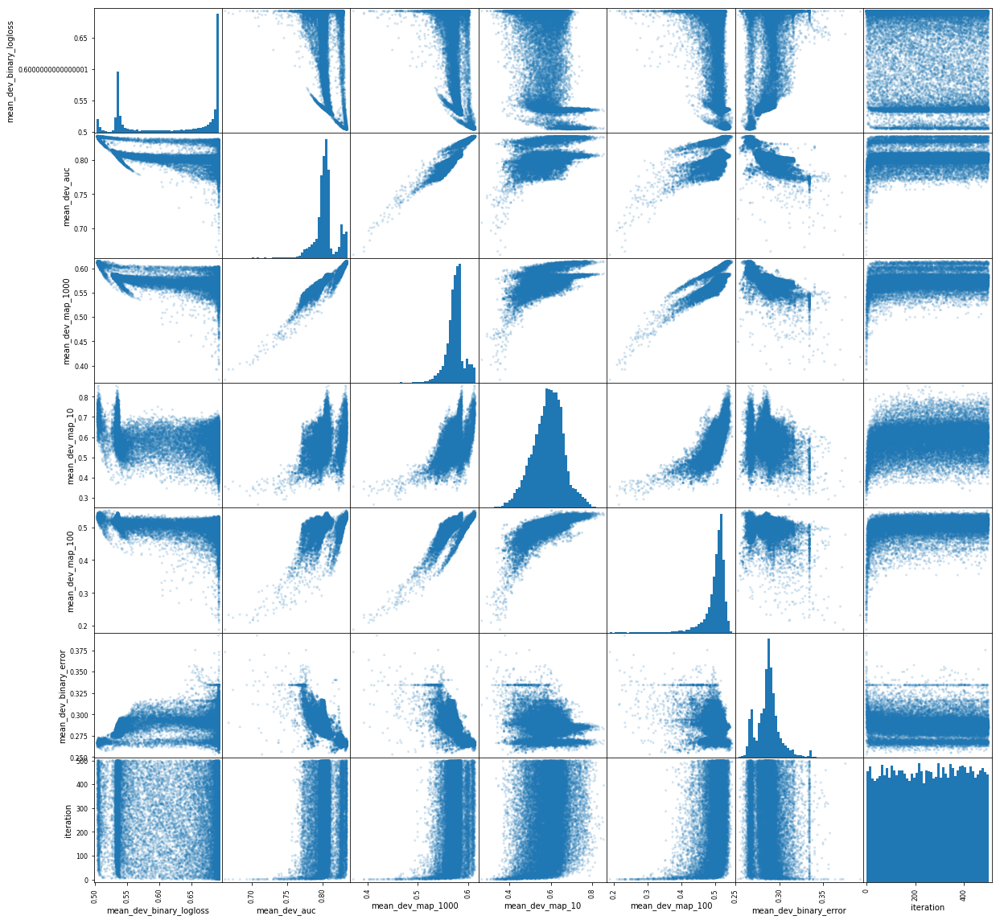

In [6]:
pd.plotting.scatter_matrix(
    narrow[['mean_dev_' + m for m in set(METRICS) - set(['kldiv'])] + ['iteration']].sample(25000), 
    alpha=0.2, figsize=(20, 20), hist_kwds={'bins': 50});

MAP@10 has bad correlation with AUC (optimizing AUC doesn't help if you only need top 10 items), MAP@1000 correlates much better.

### Don't do early stopping

In [7]:
# slow
#folds = unfold_iterations(next(read_json_log('./experiments/wide.log', chunksize=2500)))
#folds.to_pickle('./experiments/wide-folds.pkl')

In [8]:
folds = pd.read_pickle('./experiments/wide-folds.pkl')
cv_folds = folds[folds.split >= 0]
experiment = cv_folds[(cv_folds.experiment_id == 407) & (cv_folds.param_seed == 33957)]

early stopping per fold overestimates AUC:

In [9]:
experiment.groupby('split').dev_auc.max().mean()

0.8109245866471861

better to average folds per iteration:

In [10]:
experiment.groupby('iteration').dev_auc.mean().max()

0.8095165924982167

location of maximums per each fold are too different:

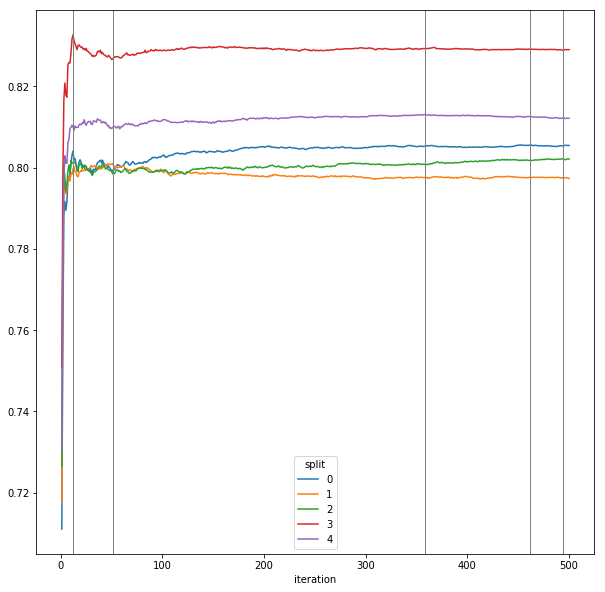

In [11]:
ax = experiment.pivot(index='iteration', columns='split', values='dev_auc').plot(figsize=(10, 10));
for x in experiment.pivot(index='iteration', columns='split', values='dev_auc').idxmax():
    ax.axvline(x=x, color='gray', linewidth=1)

sad trombone, maximum locations found on CV folds are wrong on validation set:

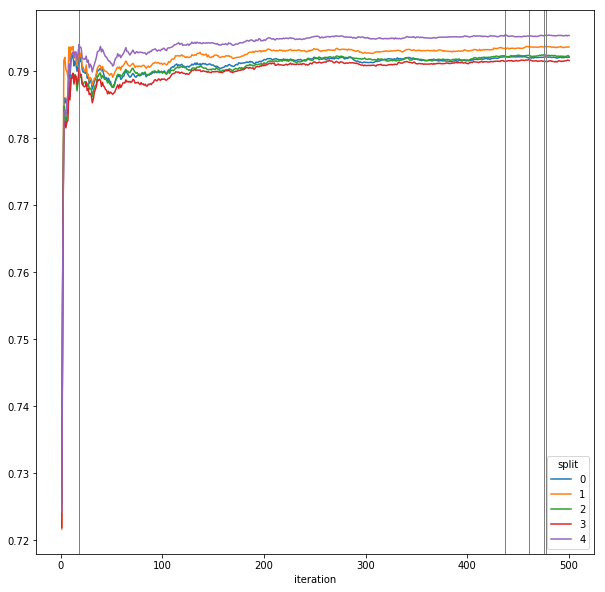

In [12]:
ax = experiment.pivot(index='iteration', columns='split', values='validation_auc').plot(figsize=(10, 10));
for x in experiment.pivot(index='iteration', columns='split', values='validation_auc').idxmax():
    ax.axvline(x=x, color='gray', linewidth=1)

logloss doesn't stop while auc hits the limit:

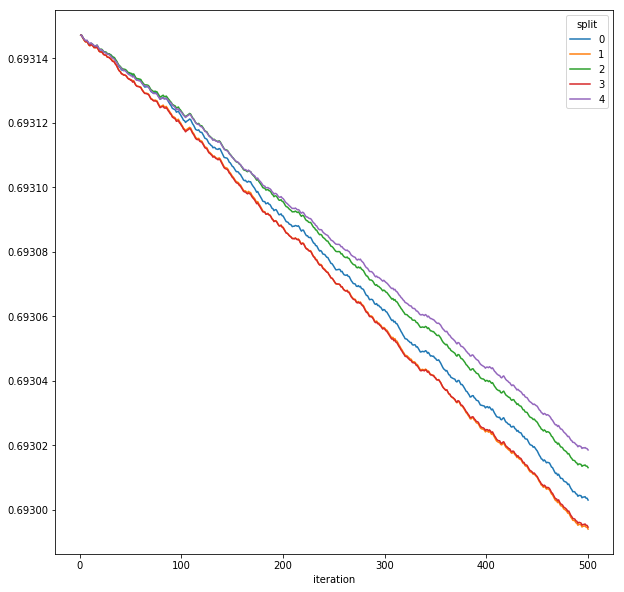

In [13]:
experiment.pivot(index='iteration', columns='split', values='dev_binary_logloss').plot(figsize=(10, 10));

Don't even try to use early stopping on several metrics at once (like logloss + auc), logloss could be weird

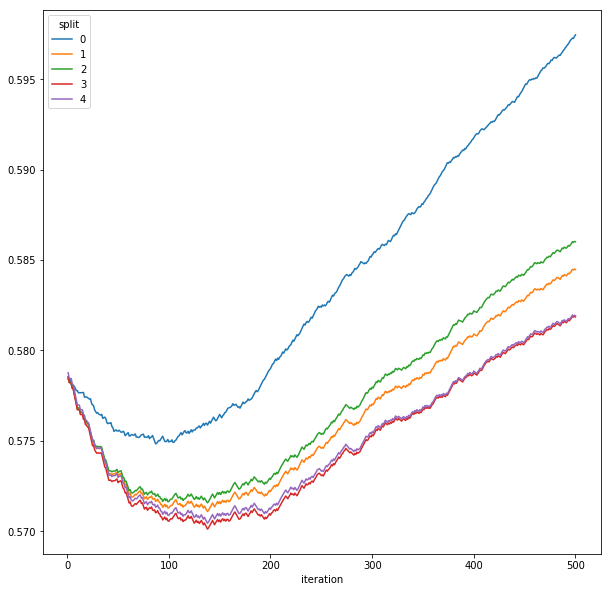

In [14]:
weird_logloss = cv_folds[(cv_folds.experiment_id == 182) & (cv_folds.param_seed == 86723)]
weird_logloss.pivot(index='iteration', columns='split', values='dev_binary_logloss').plot(figsize=(10, 10));

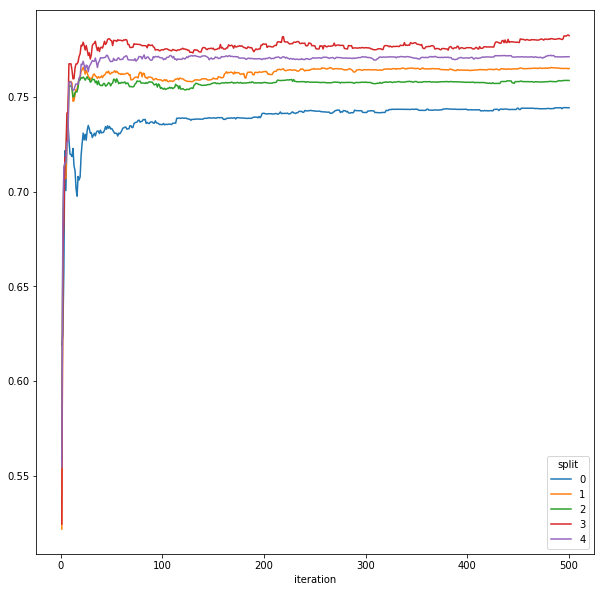

In [15]:
weird_logloss.pivot(index='iteration', columns='split', values='dev_auc').plot(figsize=(10, 10));

In [16]:
del folds, cv_folds, experiment, weird_logloss

### Check how parameters affect ROC AUC

X axis range on graphs below corresponds to parameter range in random search space. Point density means more successful experiments landed in this area.

In [17]:
df = pd.read_pickle('./experiments/wide.pkl')

In [18]:
good = df[df.mean_dev_auc > 0.70].copy()

disabled bagging `bagging_freq: 0` produces more good results than enabled

In [19]:
(good.param_bagging_freq != 0).value_counts()

False    245737
True     119847
Name: param_bagging_freq, dtype: int64

it's better to set `is_unbalance` than trying to find good class weight

In [20]:
good.param_is_unbalance.value_counts()

True     215769
False    149815
Name: param_is_unbalance, dtype: int64

top AUC values could be reached using small number of iterations

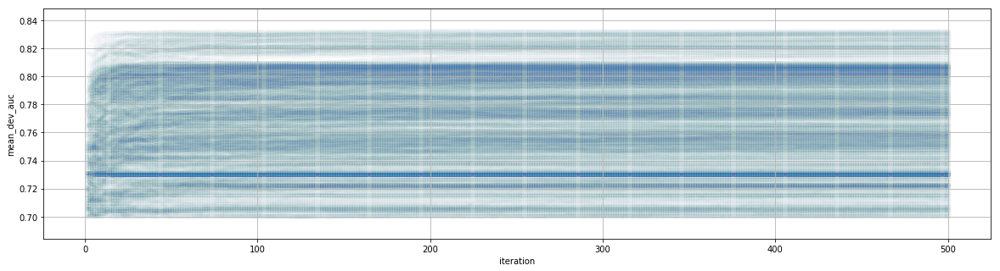

In [21]:
good.plot(x='iteration', y='mean_dev_auc', kind='scatter', alpha=0.006, grid=True);

high `min_data_in_leaf` is bad (thanks captain, dataset size is only 7000, split into 6 parts)

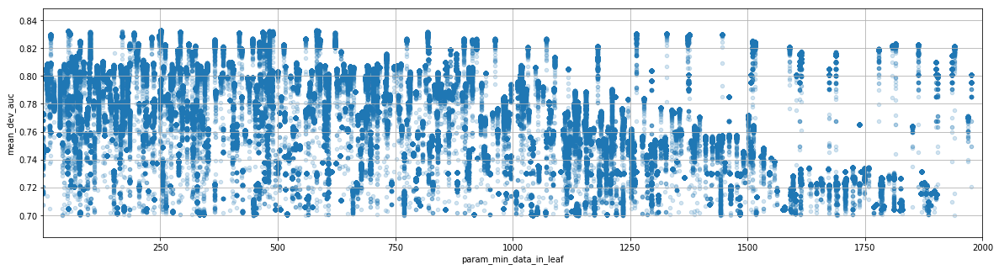

In [22]:
good.plot(x='param_min_data_in_leaf', y='mean_dev_auc', kind='scatter', alpha=0.2, 
        grid=True, xlim=(1, 2000));

same for `min_data_in_bin`

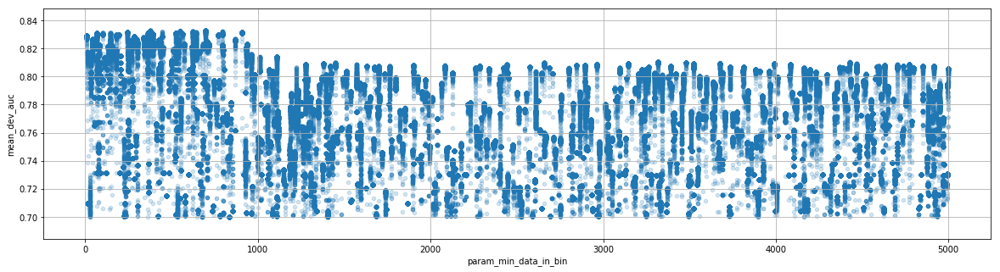

In [23]:
good.plot(x='param_min_data_in_bin', y='mean_dev_auc', kind='scatter', alpha=0.2, grid=True);

don't set `lambda_l1` too large (AUC == 0.5 for lambda_l1 > 1e3)

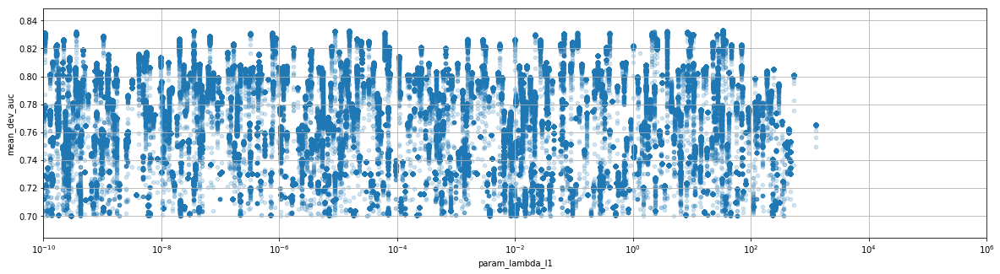

In [24]:
good.plot(x='param_lambda_l1', y='mean_dev_auc', kind='scatter', alpha=0.2, logx=True, grid=True,
         xlim=(1e-10, 1e6));

same for `min_sum_hessian_in_leaf`

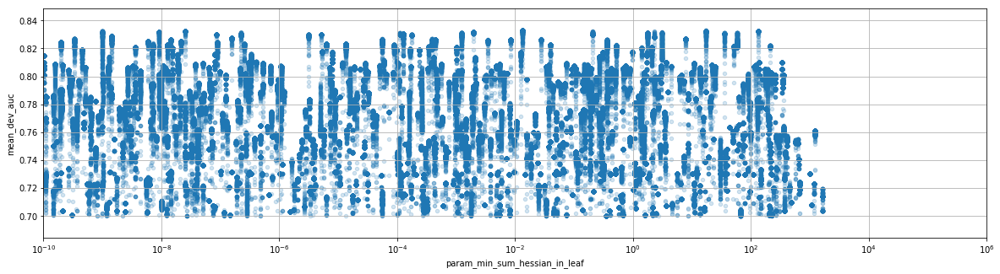

In [25]:
good.plot(x='param_min_sum_hessian_in_leaf', y='mean_dev_auc', kind='scatter', alpha=0.2, 
          logx=True, grid=True, xlim=(1e-10, 1e6));

same for `min_gain_to_split`

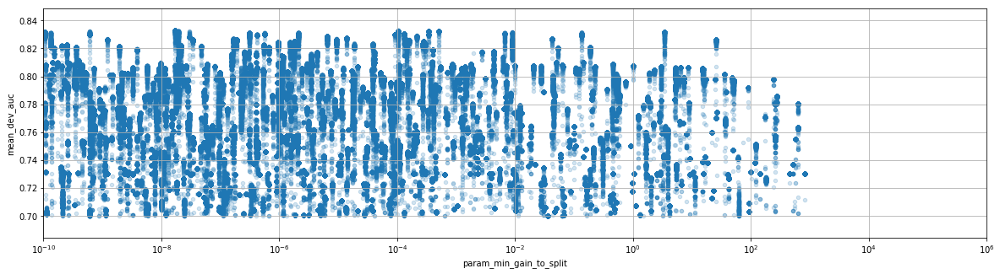

In [26]:
good.plot(x='param_min_gain_to_split', y='mean_dev_auc', kind='scatter', alpha=0.2, logx=True, grid=True,
         xlim=(1e-10, 1e6));

### Check how parameters affect overfit of ROC AUC

TODO: replot on bagging-switch-narrow range, there are interesting images

In [17]:
good_train = df[df.mean_train_auc > 0.70].copy()

In [25]:
good_train['overfit_auc'] = df.mean_train_auc - df.mean_dev_auc

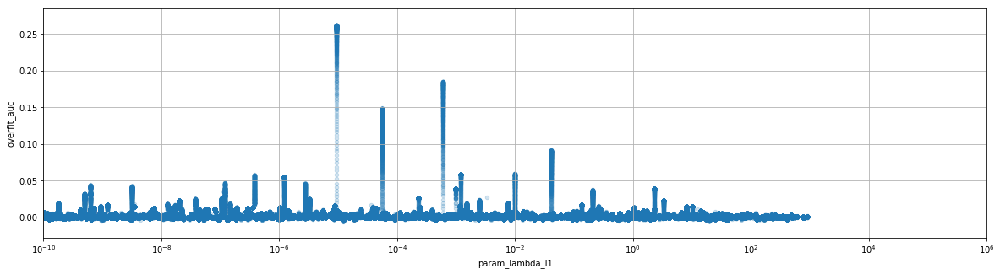

In [54]:
good_train.plot(x='param_lambda_l1', y='overfit_auc', kind='scatter', alpha=0.2, logx=True, grid=True,
         xlim=(1e-10, 1e6));

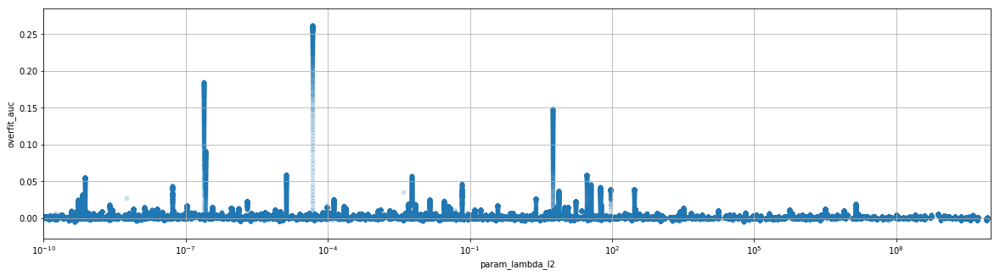

In [55]:
good_train.plot(x='param_lambda_l2', y='overfit_auc', kind='scatter', alpha=0.2, logx=True, grid=True,
         xlim=(1e-10, 1e10));

it seems that high learning rate produces less overfit but model explodes much more often in this area

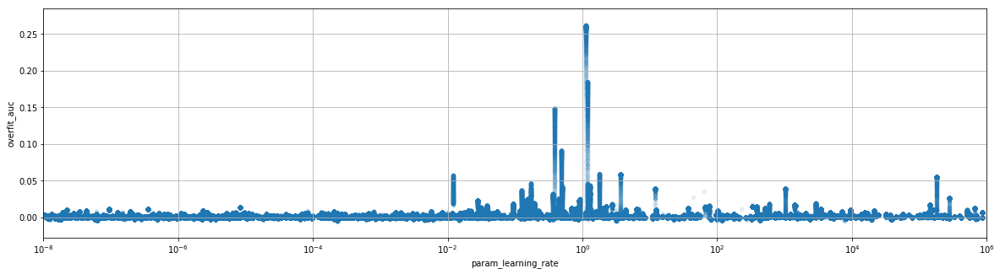

In [56]:
good_train.plot(x='param_learning_rate', y='overfit_auc', kind='scatter', alpha=0.1, 
        logx=True, grid=True, xlim=(1e-8, 1e6));

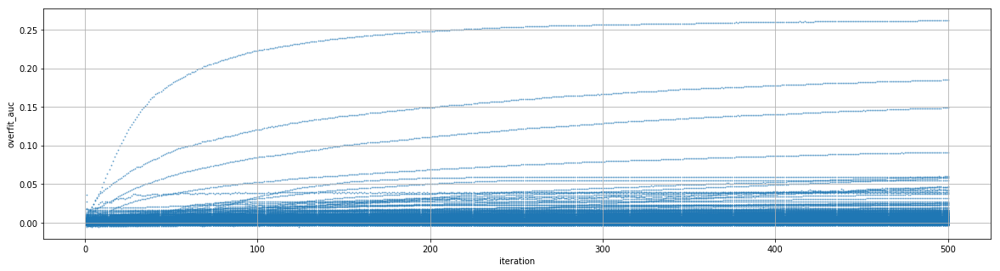

In [30]:
good_train.plot(x='iteration', y='overfit_auc', kind='scatter', alpha=0.5, grid=True, s=1);

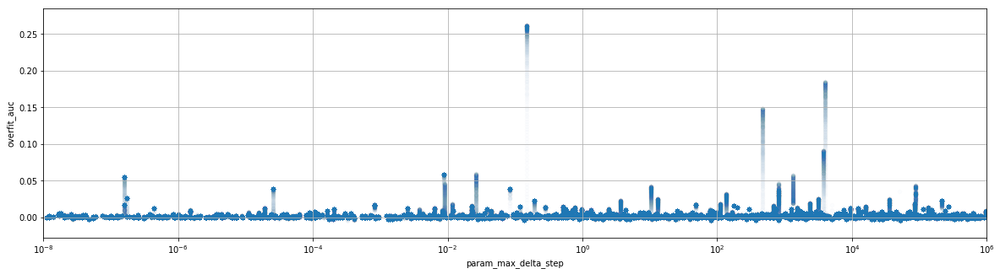

In [31]:
good_train.plot(x='param_max_delta_step', y='overfit_auc', kind='scatter', alpha=0.01, 
        logx=True, grid=True, xlim=(1e-8, 1e6));

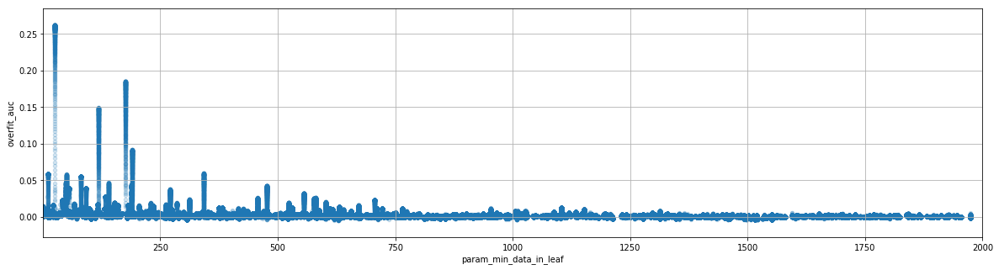

In [57]:
good_train.plot(x='param_min_data_in_leaf', y='overfit_auc', kind='scatter', alpha=0.2, 
        grid=True, xlim=(1, 2000));

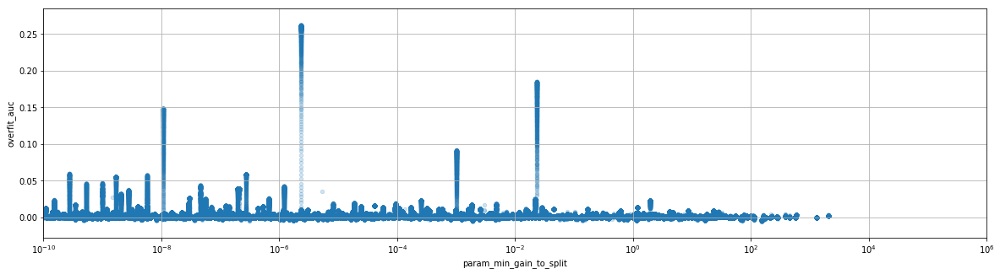

In [58]:
good_train.plot(x='param_min_gain_to_split', y='overfit_auc', kind='scatter', alpha=0.2, logx=True, grid=True,
         xlim=(1e-10, 1e6));

### Dependencies between parameters

TODO replot on bagging-switch dataset

In [34]:
max_iteration = df.sort_values('mean_dev_auc').groupby('experiment_id').last()

#### good results

In [35]:
good_max = max_iteration[max_iteration.mean_dev_auc > 0.7]

note: LOG_PARAMETER ticks are log(p)

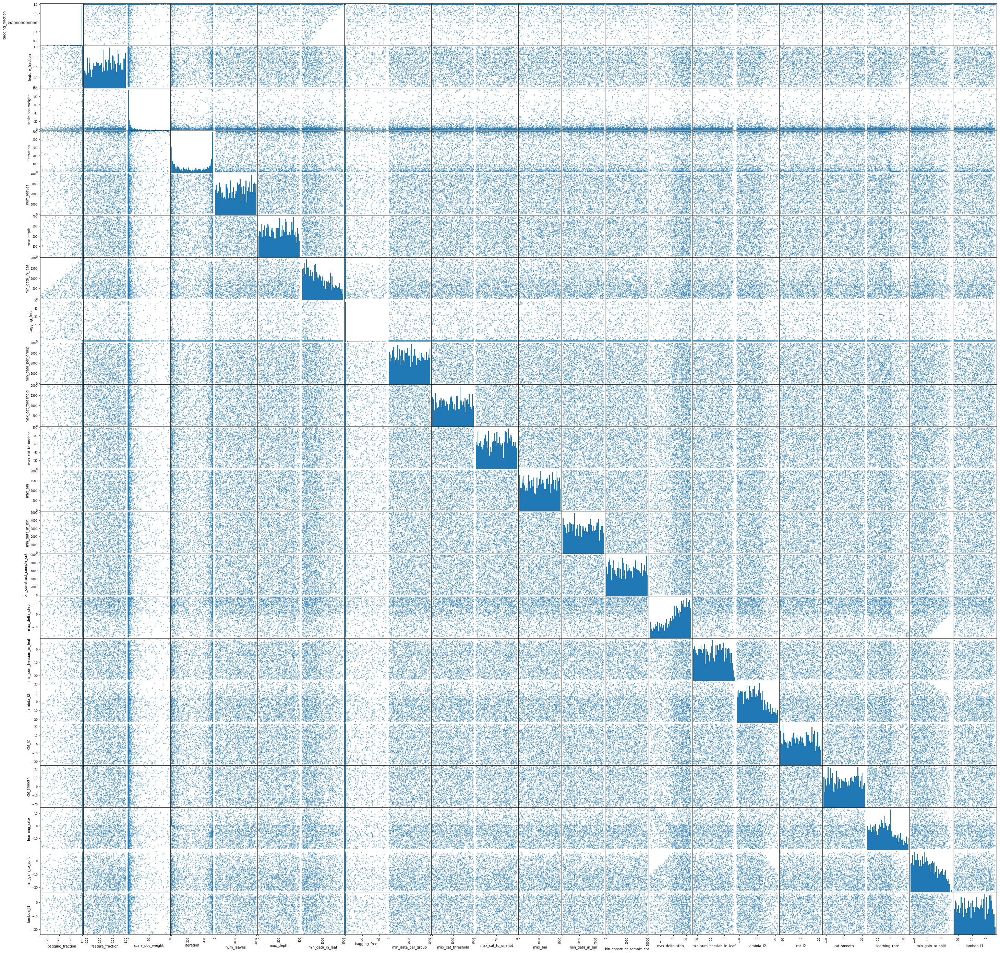

In [36]:
pd.plotting.scatter_matrix(
    pd.concat([good_max[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(good_max[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.5, figsize=(50, 50), hist_kwds={'bins': 50});

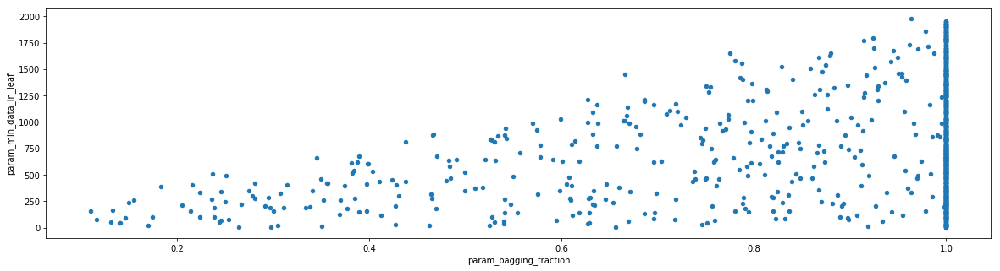

In [37]:
good_max.plot(x='param_bagging_fraction', y='param_min_data_in_leaf', kind='scatter');

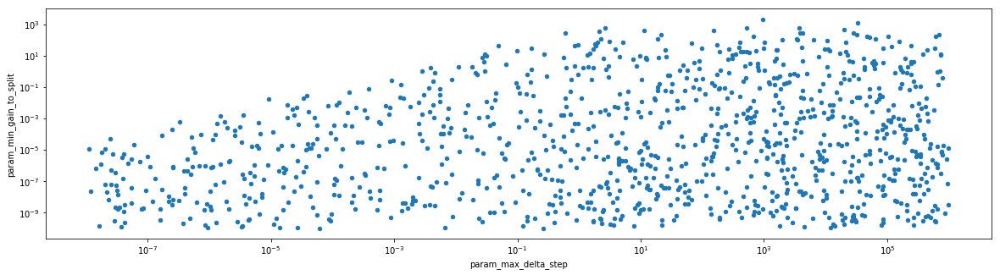

In [38]:
good_max.plot(x='param_max_delta_step', y='param_min_gain_to_split', kind='scatter', logx=True, logy=True);

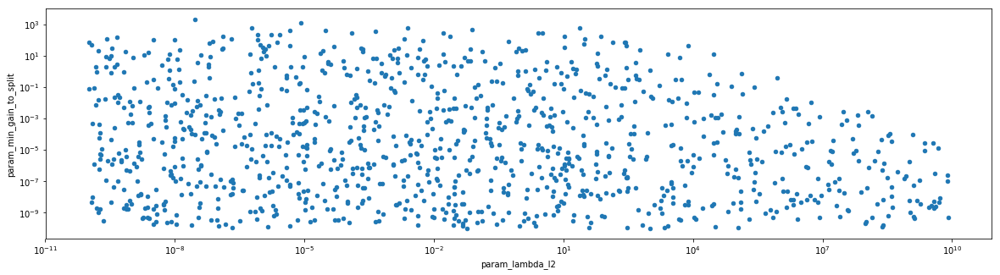

In [39]:
good_max.plot(x='param_lambda_l2', y='param_min_gain_to_split', kind='scatter', logx=True, logy=True);

surprisingly, lambda_l1 has no interaction with min_gain_to_split

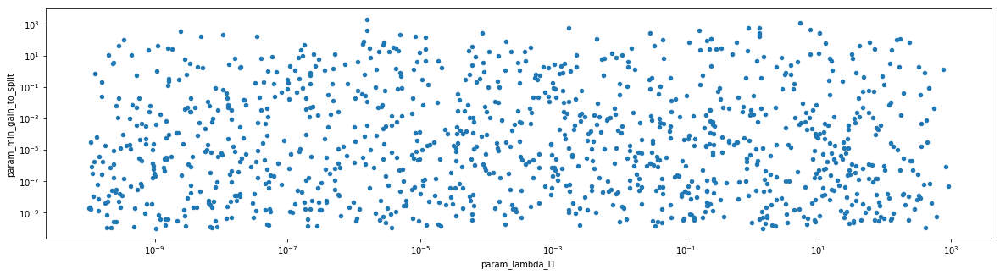

In [40]:
good_max.plot(x='param_lambda_l1', y='param_min_gain_to_split', kind='scatter', logx=True, logy=True);

no clearly visible dependency between learning_rate and iteration

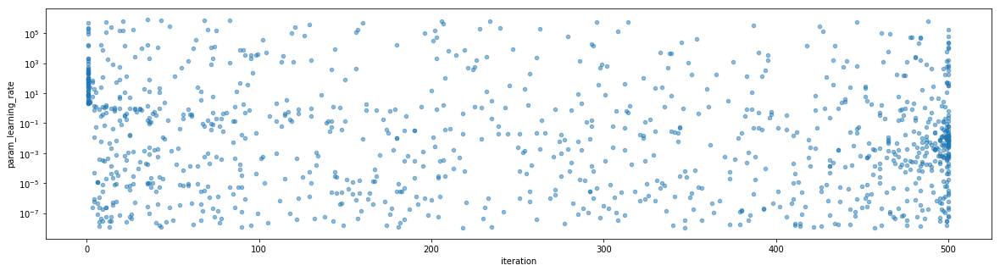

In [42]:
good_max.plot(x='iteration', y='param_learning_rate', kind='scatter', logy=True, alpha=0.5);